# Bayesian inference with PEtab in Julia

When fitting a PEtab problem to data by estimating unknown model parameters we work in a frequentist framework, as we try to find the maximum likelihood estimate. Alteratively, especially when prior information about model parameters is available, we can perform Bayesian inference. In a Bayesian inference setting we infer the posterior distribution of the unknown parameters given data; ($p(\theta|y)$), by running a [Markov chain Monte Carlo](https://en.wikipedia.org/wiki/Markov_chain_Monte_Carlo) (MCMC) algorithm.

This notebook shows how to perform Bayesian inference for PEtab problems with Adaptive Metropolis Hastings samplers, and Hamiltonian Monte Carlo (HMC) methods, specifically the No-U-Turn Sampler (NUTS) sampler.

## Brief Math Background

This section provides a brief overview of the math behind Bayesian inference. Feel free to skip if you are familiar with Bayesian inference.

When we have prior knowledge about unknown model parameters $\theta$, including the possibility of having non-informative flat priors, with Bayesian inference we infer the posterior distribution of these parameters given data $y$; $p(\theta|y)$. One interpretation of the posterior is that the unknown model parameters are a realizations (observed values from) the posterior. This makes it straightforward to assess uncertainty for inferred quantities, for example by calculating the 0.025 to 0.975 quantiles of $p(\theta|y)$, we obtain a 95% credibility interval that with 95% probability includes the true parameter value. Additionally, given the posterior distribution it is also easy to assess uncertainty in model predictions, as a prediction credibility can be computed by sampling from the posterior, and then simulating the model with these samples.

There are drawbacks with Bayesian inference though. Often we cannot derive the form of the posterior distribution $p(\theta|y)$. This makes sampling from the posterior hard, however, we can typically evaluate the posterior distribution point-wise as often we can compute the model likelihood and prior. This allows us to use [Markov chain Monte Carlo (MCMC)](https://en.wikipedia.org/wiki/Markov_chain_Monte_Carlo) methods to infer the posterior. Specifically, with these methods we construct a Markov Chain that draws samples from the posterior. And, if we sample $1000$ random values from a distribution, we can often with good accuracy compute most properties of said distribution, like the mean of a parameter.

The [Metropolis-Hastings](https://en.wikipedia.org/wiki/Metropolis%E2%80%93Hastings_algorithm) is the most famous MCMC algorithm. Frequently with this method, new parameter values in the Markov chain are proposed by using a Normal distribution kernel:

$$
\theta_{new} = \theta_{old} + q, \ q \sim \mathcal{N}(0, \Omega)
$$

If $\theta_{new}$ has a sufficiently high posterior distribution probability (is likely), it is more prone to be accepted in the MCMC chain (to explore the posterior values are accepted with a degree of randomness in Metropolis-Hasting). The effectiveness of the Metropolis-Hastings algorithm is highly dependent on the appropriate selection of the covariance matrix $\Omega$, for example if the matrix is badly chosen we are likely to propose many parameters that have small posterior probability and are not accepted. To circumvent the need for manually choosing a covariance matrix, PEtab.jl supports [AdaptiveMCMC.jl](https://github.com/mvihola/AdaptiveMCMC.jl), a Julia package for adaptive Metropolis-Hasting where during inference the covariance matrix is automatically adapted.

While automatically adapting $\Omega$ can improve performance, Metropolis-Hastings algorithms still often encounter difficulties with high-dimensional problems or for tricky posterior geometries (e.g. correlated parameters). In such cases, Hamiltonian Monte Carlo (HMC), particularly the No-U-Turn Sampler (NUTS) algorithm, often perform better - which is the reason NUTS is the primary algorithm used in the popular packages [Stan](https://mc-stan.org/) and [Turing.jl](https://github.com/TuringLang/Turing.jl). Despite being more computationally intensive than adaptive MCMC—owing due to the gradient being needed, NUTS often explores the posterior more efficiently.

## Setup 

The packages needed are:

- **PEtab.jl**: For building PEtab problems.
- **OrdinaryDiffEq.jl**: For simulating ODE models.
- **ModelingToolkit.jl**: For formulating the dynamic model
- **Distributions.jl**: For setting parameter priors.
- **AdaptiveMCMC.jl**: For performing Bayesian inference with Adaptive MCMC.
- **AdvancedHMC.jl**: For performing Bayesian inference with the `NUTS` sampler.
- **Plots.jl** and **StatsPlots.jl**: For visualizing simulation results.

In [1]:
using PEtab, OrdinaryDiffEq, ModelingToolkit, Distributions, AdaptiveMCMC, AdvancedHMC

Additionally, for using the Bayesian inference part of PEtab.jl we must load **LogDensityProblems.jl**, **LogDensityProblemsAD.jl** and **Bijectors.jl** for setting up the Bayesian inference functions:

In [2]:
using Bijectors, LogDensityProblems, LogDensityProblemsAD

## Bayesian inference with various algorithms

### Problem setup

As a case study, we will use a simple saturated growth model. We will set up this model in Julia with priors for the unknown parameters, but first let us define the model dynamics:

In [3]:
@parameters b1, b2
@variables t x(t)
D = Differential(t)
eqs = [
    D(x) ~ b2*(b1 - x)
]
specie_map = [x => 0]
parameter_map = [b1 => 1.0, b2 => 0.2]
@named sys = ODESystem(eqs)

Model sys with 1 equations
States (1):
  x(t)
Parameters (2):
  b1
  b2

We start with simulating some data to fit the model to.

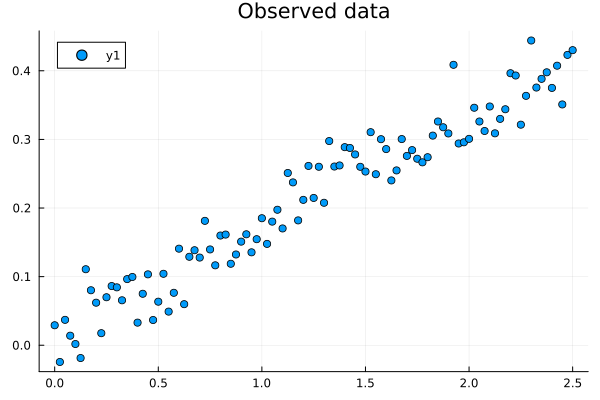

In [4]:
using Random, Plots
Random.seed!(1234)
oprob = ODEProblem(sys, specie_map, (0.0, 2.5), parameter_map)
tsave = collect(range(0.0, 2.5, 101))
dist = Normal(0.0, 0.03)
_sol = solve(oprob, Rodas4(), abstol=1e-12, reltol=1e-12, saveat=tsave, tstops=tsave)
# Normal measurement noise with σ = 0.03
obs = _sol[:x] .+ rand(Normal(0.0, 0.03), length(tsave))
plot(_sol.t, obs, seriestype=:scatter, title = "Observed data")

Now we can provide the rest of information needed for setting up a `PEtabODEProblem`:

In [5]:
using DataFrames
# Measurement data
measurements = DataFrame(
    obs_id="obs_X",
    time=_sol.t,
    measurement=obs)
# Observable
@parameters sigma
obs_X = PEtabObservable(x, sigma)
observables = Dict("obs_X" => obs_X)

Dict{String, PEtabObservable{Num, Num}} with 1 entry:
  "obs_X" => PEtabObservable: h = x(t), noise-formula = sigma and normal (Gauss…

When defining the parameters for our model, we can assign a prior using any continuous distribution available in [Distributions.jl](https://github.com/JuliaStats/Distributions.jl). For instance, we can set the following priors for our parameters:

- $b_1$: Uniform distribution between 0.0 and 5.0; $ \ b_1 \sim \mathcal{U}(0.0, 5.0) $.
- $ \mathrm{log}_{10}(b_2)$ : Uniform distribution between -6.0 and $ \mathrm{log}_{10}(5.0) $, $\ \mathrm{log}_{10}(b_2) \sim \mathcal{U}\big(-6.0, \mathrm{log}_{10}(5.0) \big) $.
- $ \sigma $ : Gamma distribution with shape and rate parameters both set to 1.0, $ \ \sigma \sim \mathcal{G}(1.0, 1.0) $.

In [6]:
_b1 = PEtabParameter(b1, value=1.0, lb=0.0, ub=5.0, scale=:log10, prior_on_linear_scale=true, prior=Uniform(0.0, 5.0))
_b2 = PEtabParameter(b2, value=0.2, scale=:log10, prior_on_linear_scale=false, prior=Uniform(-6, log10(5.0)))
_sigma = PEtabParameter(sigma, value=0.03, lb=1e-3, ub=1e2, scale=:lin, prior_on_linear_scale=true, prior=Gamma(1.0, 1.0))
parameters_ets = [_b1, _b2, _sigma]

3-element Vector{PEtabParameter}:
 PEtabParameter b1. Estimated on log10-scale with bounds [0.0e+00, 5.0e+00] and prior Uniform{Float64}(a=0.0, b=5.0)
 PEtabParameter b2. Estimated on log10-scale with bounds [1.0e-03, 1.0e+03] and prior Uniform{Float64}(a=-6.0, b=0.6989700043360189)
 PEtabParameter sigma. Estimated on lin-scale with bounds [1.0e-03, 1.0e+02] and prior Gamma{Float64}(α=1.0, θ=1.0)

When specifying priors in PEtab.jl, it is important to note that parameters are by default estimated on the $\mathrm{log}_{10}$ scale (can be changed by `scale` argument). When `prior_on_linear_scale=false` the prior applies to this parameter scale (default $\mathrm{log}_{10}$), therefore the prior for `b2` is on the $\mathrm{log}_{10}$ scale. If `prior_on_linear_scale=true`, the prior is in the linear scale, which in this case holds for `b1` and `sigma`. If a prior is not specified, the default prior is a Uniform distribution on the parameter scale, with bounds that correspond to upper and lower bounds specified for the `PEtabParameter`. 

With the priors defined, we can proceed to establish a `PEtabLogDensity`. This structure contains everything needed for performing Bayesian inference.

In [7]:
petab_model = PEtabModel(sys, observables, measurements, parameters_ets; state_map=specie_map, verbose=false)
petab_problem = PEtabODEProblem(petab_model; ode_solver=ODESolver(Rodas5(), abstol=1e-6, reltol=1e-6), verbose=false)
target = PEtabLogDensity(petab_problem)

PEtabLogDensity with 3 parameters to infer.

When we below perform Bayesian inference, the settings for the ODE solver and gradient computations are those in `petab_problem`. For instance, in this case, we use the default gradient method (`ForwardDiff`) and simulate the ODE model with the `Rodas5` ODE solver.

### Adaptive MCMC

As a start, we will first explore the robust adaptive Metropolis-Hastings algorithm from [AdaptiveMCMC.jl](https://github.com/mvihola/AdaptiveMCMC.jl). Although the choice of a starting point for the inference process is crucial (and will be discussed further), for simplicity, we will begin with the parameter vector used for simulating the data (note that the second parameter is on $\mathrm{log}_{10}$ scale).

In [8]:
xpetab = petab_problem.θ_nominalT

3-element Vector{Float64}:
  0.0
 -0.6989700043360187
  0.03

When conducting Bayesian inference with PEtab.jl, an important **important** note is that inference is carried out on the scale defined by the priors. For instance, if a parameter is set with `scale=:log10`, but the prior is defined on the linear scale (`prior_on_linear_scale=true`), then inference is performed on the linear scale.

Moreover, Bayesian inference algorithms typically prefer to operate in an unconstrained space, that is a prior such as $b_1 \sim \mathcal{U}(0.0, 5.0)$, where the parameter is bounded is not ideal. To address this, bounded parameters are [transformed](https://mc-stan.org/docs/reference-manual/change-of-variables.html) to be unconstrained. As an example, consider a parameter $z$ that must be positive, we can transform it to $\mathrm{log}(z)$ and during inference target the unconstrained $\mathrm{log}(z)$ parameter.

In summary, for a parameter vector on the PEtab parameter scale (`xpetab`), for inference we must transform to the prior scale (`xprior`), and then to the inference scale (`xinference`). This can be done via:

In [9]:
xprior = PEtab.to_prior_scale(petab_problem.θ_nominalT, target)
xinference = target.inference_info.bijectors(xprior)

3-element Vector{Float64}:
 -1.3862943611198906
  1.3329014098421619
 -3.506557897319982

Now we are ready to perform Bayesian inference. As an example, let us take $200,000$ posterior samples. To easily interpret the out we can also covnert it into a `MCMCChains` object:

In [10]:
using MCMCChains
Random.seed!(123)
# target.logtarget = posterior logdensity
res = adaptive_rwm(xinference, target.logtarget, 200000; progress=false)
chain_adapt = PEtab.to_chains(res, target)

Chains MCMC chain (160001×3×1 Array{Float64, 3}):

Iterations        = 1:1:160001
Number of chains  = 1
Samples per chain = 160001
parameters        = b1, b2, sigma

Summary Statistics
  parameters      mean       std      mcse    ess_bulk     ess_tail      rhat  ⋯
      Symbol   Float64   Float64   Float64     Float64      Float64   Float64  ⋯

          b1    1.8823    0.9025    0.0459    500.2392     402.0925    1.0368  ⋯
          b2   -0.9554    0.2097    0.0098    501.0087     414.7185    1.0377  ⋯
       sigma    0.0317    0.0023    0.0000   7945.1573   13743.0655    1.0003  ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

          b1    0.8704    1.2118    1.5761    2.2804    4.0849
          b2   -1.3681   -1.0992   -0.9233   -0.7934   -0.6220
       sigma    0.0276    0.0301    0.0316    0.0331    0.0365

Note that `chain_adapt` report the distribution on the prior scale (`xprior`). We can also plot the result:

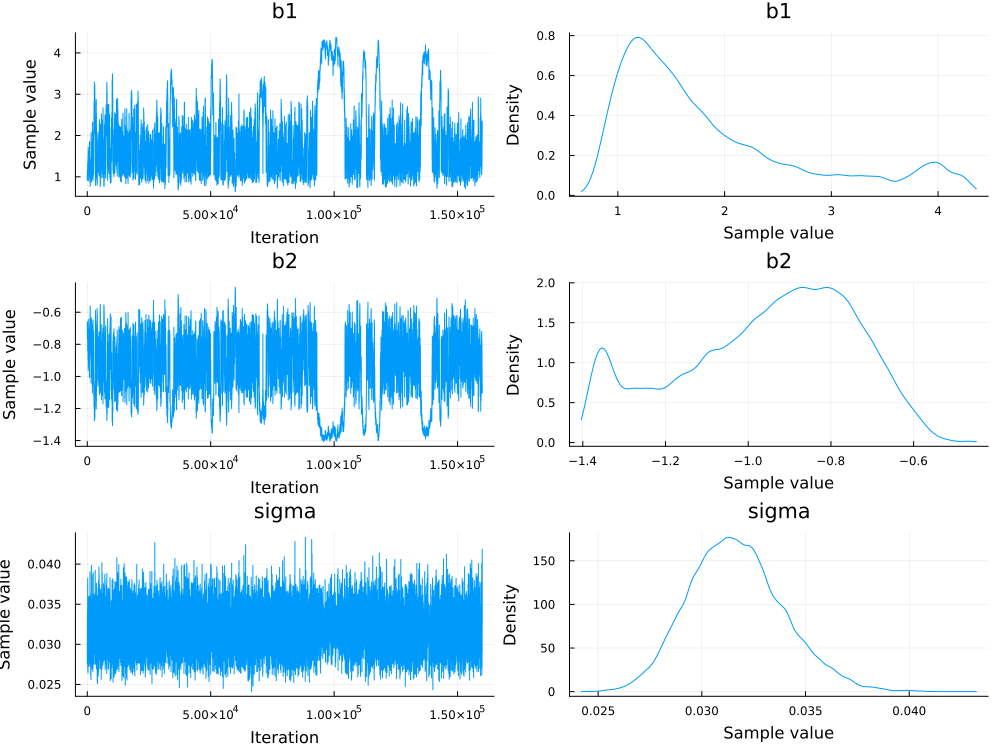

In [11]:
using Plots, StatsPlots
plot(chain_adapt)

Note that the first $40 \, 000$ samples are disregarded as burn-in. Examination of the chains suggests good mixing, as indicated by the seemingly mostly random jumps in the left trace plot. However, there is a minor issue with adequately sampling the extreme right and left tails for `b1` and `b2`, respectively. This could likely be resolved by increasing the number of samples. Still, considering the true parameter values are `[b1, b2, sigma] = [1.0, -1.0, 0.03]`, the inference seems to have worked quite well.

To further investigate if we have properly sampled from posterior, we can use diagnostic measure (more details on these can be found [here](https://mc-stan.org/rstan/reference/Rhat.html). Starting with the effective Sample Size (ESS), it is larger than 100 (see table output above) for all parameter. An ESS $>100$ is often considered necessary for trusting values computed from the inferred distribution, such as the posterior mean. Additionally, the $\hat{R}$ diagnostic value is as recommended below 1.05 for all parameters, suggesting that we have properly sampled from the posterior (e.g. not missed a tail). However, for a better estimate of $\hat{R}$, we should run multiple chains from different starting points (more on this below). For further information on how to interact with the `MCMCChains`, see the [MCMCChains.jl documentation](https://github.com/TuringLang/MCMCChains.jl). Note, depending on the task, a higher ESS might be needed, see this [excellent article](https://arxiv.org/abs/2311.02726) for more details.

### Hamiltonian Monte Carlo (NUTS)

To see if we can improve inference performance, we can try Hamiltonian Monte Carlo (HMC) methods, specifically the NUTS sampler from [AdvancedHMC.jl](https://github.com/TuringLang/AdvancedHMC.jl), which is also used by Turing.jl. Similar to the previous approach, we perform inference on a transformed scale `xinference`, and the results reported on the prior scale. Let us take $2000$ samples, with a  $1000$ adaptation samples to allow the algorithm to properly adapt its tunatable parameters (e.g. step-length):

In [12]:
Random.seed!(1234)
# δ=0.8 - acceptance rate (default in Stan)
sampler = NUTS(0.8)
res = sample(target, sampler,
             2000;
             nadapts = 1000,
             initial_params = xinference,
             drop_warmup=true,
             progress=false)
chain_hmc = PEtab.to_chains(res, target)

┌ Info: Found initial step size 0.00625
└ @ AdvancedHMC /home/sebpe/.julia/packages/AdvancedHMC/AlvV4/src/abstractmcmc.jl:316


Chains MCMC chain (2000×3×1 Array{Float64, 3}):

Iterations        = 1:1:2000
Number of chains  = 1
Samples per chain = 2000
parameters        = b1, b2, sigma

Summary Statistics
  parameters      mean       std      mcse   ess_bulk   ess_tail      rhat   e ⋯
      Symbol   Float64   Float64   Float64    Float64    Float64   Float64     ⋯

          b1    1.8903    0.9385    0.0663   229.4717   265.8819    1.0004     ⋯
          b2   -0.9551    0.2144    0.0145   230.3404   273.5797    1.0004     ⋯
       sigma    0.0316    0.0024    0.0001   850.8247   865.1639    1.0005     ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

          b1    0.8427    1.2146    1.5631    2.3041    4.3950
          b2   -1.4008   -1.1038   -0.9175   -0.7929   -0.6042
       sigma    0.0274    0.0299    0.0313    0.0331    0.0364


We can also plot the chain:

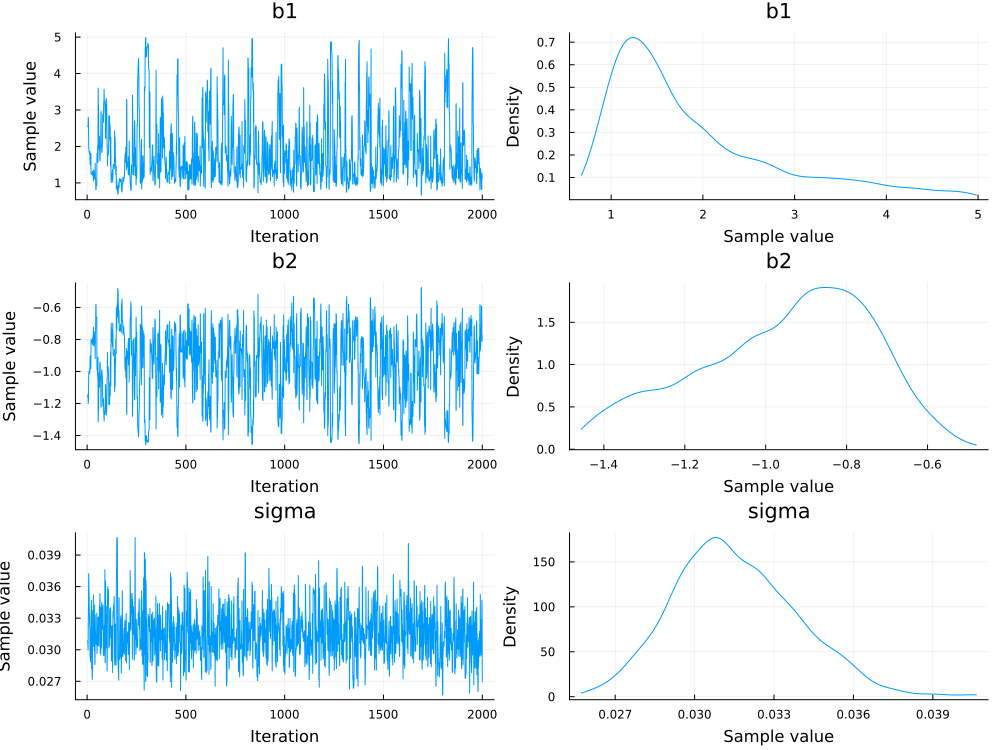

In [13]:
plot(chain_hmc)

If we compare the results NUTS with those from the adaptive MCMC approach, we see that despite the fewer samples collected using NUTS, it more effectively explores the tails, which supported by NUTS in general having lower $\hat{R}$ parameter values. This observation generally holds: while individual samples from NUTS are more computationally demanding, the samples have good quality (more indepedent) which often means that a relatively small number of samples, typically between 1000 to 2000, is sufficient for NUTS, while for adaptive MCMC we often need take more than $100 \, 000$ samples. 

### Finding a good start-guess

To be confident in our inference results, it is crucial to verify that our inference has managed to fully infer the posterior distribution. For a single chain, the $\hat{R}$ value provides an indication of convergence by comparing the first and second halves of the chain sample. However, a more reliable estimate of $\hat{R}$ can be obtained by running multiple chains from different starting points. Then, if all chains converge to the same distribution (indicated by small $\hat{R}$), we can have more confidence in our results.

Choosing these starting points is challenging though. One approach is to draw random staring points from the prior distribution. This is straightforward, but may be inefficient as especially in ODE models the posterior landscape might be complex and difficult to navigate in certain regions. And, as a single step with NUTS is computationally expansive, this can be very inefficient. An alternative approach is to start the chains from the optimal parameter values obtained from preliminary parameter estimation run. However, for an accurate estimation of $\hat{R}$, we need to start our chains from different points.

Ideally, our chains should start from random points sampled from the posterior distribution itself. Given that the true posterior is unknown and we aim to infer it, this is not possible. However, one solution is to approximate the posterior. The [Pathfinder algorithm](https://github.com/mlcolab/Pathfinder.jl) is one algorithm approximating the posterior. Specifically, it performs multiple parameter estimation runs, and then uses the trajectory from these run to approximate the posterior. In the context of our case sutdy, let us try the Pathfinder algorithm with 100 parameter estimation runs, where our starting points are sampled from the prior. Note, these start-guesses need to be on the inference scale (`xinference`):

In [14]:
Random.seed!(12345)
xstart_petab = generate_startguesses(petab_problem, 100)
# Prior scale
xstart_prior = [PEtab.to_prior_scale(xstart_petab[:, i], target) for i in 1:size(xstart_petab)[2]]
# Inference scale
xstart_inference = [target.inference_info.bijectors(x) for x in xstart_prior]

100-element Vector{Vector{Float64}}:
 [-1.1855342515713445, 1.308081939816347, 1.0077335742074656]
 [-0.8544608699245007, 0.3620240081021801, 0.0913929349660097]
 [1.4609338359815833, 0.33277050061538527, 1.1335689699769282]
 [2.3109091262698764, 2.9128253168127505, -1.139946568280094]
 [-2.4602299873226365, 1.7686193890641881, 0.935963485961421]
 [-0.12594105485345072, 0.9717834284653931, -0.7744739144729149]
 [-2.117346401849065, 2.0464156766025816, -1.2241237036867036]
 [-0.733118191415537, 1.7956034710727327, 0.2548611193852151]
 [1.0134224850368292, 1.8709628114118428, -0.07854749539661374]
 [1.9517313525148419, 0.35773254877942595, -6.30917145605011]
 ⋮
 [0.1121564414129653, 0.1782246344435829, -0.1406662765039885]
 [0.4029700262719631, -0.04727927509208288, -0.011707432764767732]
 [-0.8136246952215703, 5.020292743422578, -5.9217031168327345]
 [0.25989199001807956, 0.12864701607975074, -0.15709715587174136]
 [-3.1189829590151206, -0.17941396870118015, -2.472215276891737]
 [-0.299

Here, `xstart_inference` is Vector of Vectors containing our starting points. These are sampled from the prior and can be provided to the pathfinder algorithm.

In [15]:
using Pathfinder, Suppressor
Random.seed!(12345)
# For hiding warnings
pathfinder_res = nothing
@suppress begin
    pathfinder_res = multipathfinder(target, 100; init = xstart_inference)
end
pathfinder_res

Multi-path Pathfinder result
  runs: 100
  draws: 100
  Pareto shape diagnostic: 0.73 (bad)

We can now select 4 samples from these approximated posterior draws to serve as starting points for our main inference:

In [16]:
draws_pathfinder = pathfinder_res.draws[:, 1:4]' |> Matrix

4×3 Matrix{Float64}:
 -0.750342  1.13281  -3.57725
 -1.13429   1.25588  -3.34087
 -0.823891  1.15801  -3.30656
 -0.879408  1.17366  -3.38929

As we now run four more chains, let us take only 500 adaptation steps, along with 1000 samples for NUTS:

In [17]:
Random.seed!(12345)
# δ=0.8 - acceptance rate (default in Stan)
sampler = NUTS(0.8)
res = Vector{Any}(undef, 4)
chain_res = similar(res)
for i in 1:4
    res[i] = sample(target, sampler, 1000; nadapts = 500, initial_params = draws_pathfinder[i, :], 
                    drop_warmup=true, progress=false)
    chain_res[i] = PEtab.to_chains(res[i], target)
end
nothing

┌ Info: Found initial step size 0.0125
└ @ AdvancedHMC /home/sebpe/.julia/packages/AdvancedHMC/AlvV4/src/abstractmcmc.jl:316
┌ Info: Found initial step size 0.0125
└ @ AdvancedHMC /home/sebpe/.julia/packages/AdvancedHMC/AlvV4/src/abstractmcmc.jl:316


┌ Info: Found initial step size 0.0125
└ @ AdvancedHMC /home/sebpe/.julia/packages/AdvancedHMC/AlvV4/src/abstractmcmc.jl:316
┌ Info: Found initial step size 0.00625
└ @ AdvancedHMC /home/sebpe/.julia/packages/AdvancedHMC/AlvV4/src/abstractmcmc.jl:316


And for easing interpretation, we can put the chains into a single `MCMCChains`

In [18]:
res = zeros(1000, 3, 4)
# Put all chains into a single big array res
res[:, :, 1] .= chain_res[1][:, :, :] |> Array
res[:, :, 2] .= chain_res[2][:, :, :] |> Array
res[:, :, 3] .= chain_res[3][:, :, :] |> Array
res[:, :, 4] .= chain_res[4][:, :, :] |> Array
chains = Chains(res, target.inference_info.parameters_id)

Chains MCMC chain (1000×3×4 Array{Float64, 3}):

Iterations        = 1:1:1000
Number of chains  = 4
Samples per chain = 1000
parameters        = b1, b2, sigma

Summary Statistics
  parameters      mean       std      mcse    ess_bulk    ess_tail      rhat   ⋯
      Symbol   Float64   Float64   Float64     Float64     Float64   Float64   ⋯

          b1    1.8503    0.9165    0.0542    328.6680    397.6024    1.0143   ⋯
          b2   -0.9465    0.2091    0.0119    329.5993    394.9939    1.0143   ⋯
       sigma    0.0317    0.0024    0.0001   1794.8690   1462.1818    1.0061   ⋯
                                                                1 column omitted

Quantiles
  parameters      2.5%     25.0%     50.0%     75.0%     97.5% 
      Symbol   Float64   Float64   Float64   Float64   Float64 

          b1    0.8952    1.2004    1.5246    2.2283    4.3934
          b2   -1.3987   -1.0889   -0.9057   -0.7882   -0.6324
       sigma    0.0274    0.0300    0.0315    0.0332    0.0366


The $\hat{R}$ suggests that we properly have explored the posterior. We can also plot the four chains.

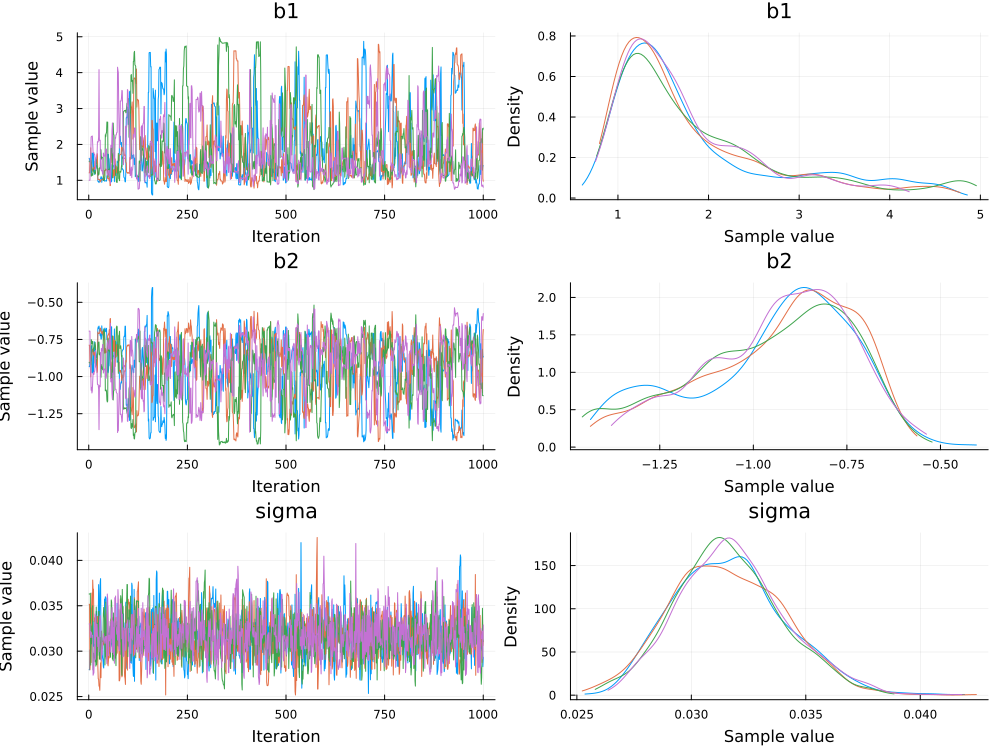

In [19]:
plot(chains)

We see that all chains appear to sample from the same posterior distribution.

Selecting optimal starting points for Bayesian inference is still an open research question. Using an approximate posterior, such as that generated by the pathfinder algorithm, is one possible strategy. A current limitation of pathfinder is its reliance on the `LBFGS` parameter estimation algorithm, which may not always identify the optimal mode for more complex problems. An alternative approach could involve conducting a preliminary parameter estimation with, for example, 1000 multistarts, using different more efficient algorithms available in PEtab.jl (see ADD notebook) (ADD). The runs that then converge to the best values could then be used for pathfinder.

In this case study, the `PEtabODEProblem` was defined directly within Julia. It should be noted that priors can also be specified using the [PEtab table format](https://petab.readthedocs.io/en/latest/). Once the problem is imported into PEtab.jl and a `PEtabODEProblem` is created, running Bayesian inference can be done as above, by first creating a `PEtabLogDensity`.